# E4 - Local Dynamic Range Compression (*ldrc*)


## 1. Introduction
#### Technical background
One of the key challenges for high order SOFI is the high dynamic range (HDR) of pixel intensities [1]. The HDR issue also exists in the high order moment images [2]. We have developed the 'local dynamic range compression (ldrc)' to mitigate such issue in our prior studies [2], which is included in the *pysofi* package. The ldrc algorithm compresses the dynamic range of these reconstructions with respect to a reference image (mask) while retaining resolution enhancement. The compression is performed locally in a small window that is scanned across the image. For details of the *ldrc* method, please see Appendix 4 of this [paper](https://www.osapublishing.org/boe/fulltext.cfm?uri=boe-11-2-554&id=425585) and Chapter 5 of this [dissertation](https://escholarship.org/uc/item/5xs5v4qm).


#### What's included in this notebook

*ldrc* can be used as a standalone function (section 3), it can also be used through the PysofiData class (section 4). Similar to other modules, the benefit of using *ldrc* as a standalone function module offers more flexibility for the developers, while using it within the PysofiData class is to take advantage of the existing workflow in **pysofi**. The difference of the syntax for both options are negligible, and here we provide demonstrations for both options. The demonstration is performed on the $6^{th}$ order moment image of the dataset.


#### Relevant dataset
The datafiles used in the examples (Jupyter Notebooks) are included in the *exampledata* folder in the **pysofi** repository. In this notebook, we use an experimental dataset from our previous work [1]. The sample is a Hela cell transfected with Dronpa-C12 (fluorescent protein) fused to β-Actin. Details of the experimental procedure are availble in the relevant pulbication [1]. we only used 200 frames in this demonstration ('Block1.tif') to obtain the relevant moment image. 


## 2. Import all the tools
Before we begin, let's first import all the relevant packages and modules.

In [3]:
import sys
sys.path.append('..')
import numpy as np
import matplotlib.pyplot as plt
from functions import pysofi
from functions import ldrc
from functions import reconstruction as r
from functions import visualization as v
import tifffile as tiff
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 3. Use the <code>ldrc.py</code> module for the *ldrc* analysis 
Here we demonstrate using ldrc.py module to perform the ldrc analysis on the $6^{th}$ order moment image.

#### 3.1. Define the datafile path and name, and prepare the input
First, we define the file path and file name


In [2]:
filepath = '../sampledata'
filename = 'Block1.tif'

Then we calculate the $6^{th}$ order moment as the input image for demonstration, and calculate the aveage image as the input reference image.


In [3]:
m6 = r.calc_moment_im(filepath, filename, order=6, frames=[0,50])
mean = r.average_image(filepath, filename)

Calculating the 6-order moment ...
[==============================] 100.0%



 We can plot reconstructions using either <code>matplotlib.pyplot.imshow</code> or <code>v.bokeh_visualization_mult</code>.

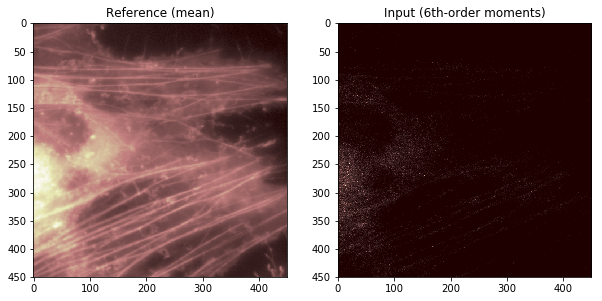

In [4]:
# Plot mean and m6 with imshow
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].set_title('Reference (mean)')
axs[0].imshow(mean, cmap='pink')

axs[1].set_title('Input (6th-order moments)')
axs[1].imshow(m6, cmap='pink')
plt.show()

We can see that the dynamic range of the $6^{th}$ order moment is expanded greatly and the feature of interest is almost invisible. We can also use the visualizatio module to plot the images to access the tools provided in Bokeh to have a close inspection of the pixel values of the images.

In [5]:
# Plot mean and m6 in Bokeh with hover tool and save the image as html file.
v.bokeh_visualization_mult([mean, m6], 
                           ['Reference (mean)', 'Input (6th-order moments)'], 
                           save_option = True,
                           filename='Comparison of mean and m6')

The pixel values in M6 ($6^{th}$ order moment iamge) has a much larger dynamic range, and when compared to the average image, M6 appears to be dimmer and most of the details are imperceptible.

#### 3.2: use the ldrc module for the *ldrc* processing.

Now we can use the *ldrc* module. The parameters for function <code>ldrc.ldrc</code> are:
+ <code>mask_im</code>: the reference image. Here we use the average image.
+ <code>input_im</code>: the input image that need dynamic range compression.
+ <code>order</code>: if [Fourier interpolation](https://github.com/xiyuyi-at-LLNL/pysofi/blob/master/Notebooks/E5_FourierInterpolation.ipynb) is used when generating high-order reconstructions, this input order help to match the size between mask_im and input_im.
+ <code>window_size</code>: The size of the scanning window, determined empirically.

The following command performs the dynamic range compression of the $6^{th}$ order moment image (M6) with reference to the average image (*mean*).

In [6]:
ldrc_im = ldrc.ldrc(mask_im=mean, input_im=m6, order=6, window_size=[20, 20])

[====================] 100%

Please refer to the [documentaion](https://github.com/xiyuyi-at-LLNL/pysofi/blob/master/functions/ldrc.py) for details of each parameter for <code>ldrc.ldrc</code>. 

Now we can take a look at the processing results.

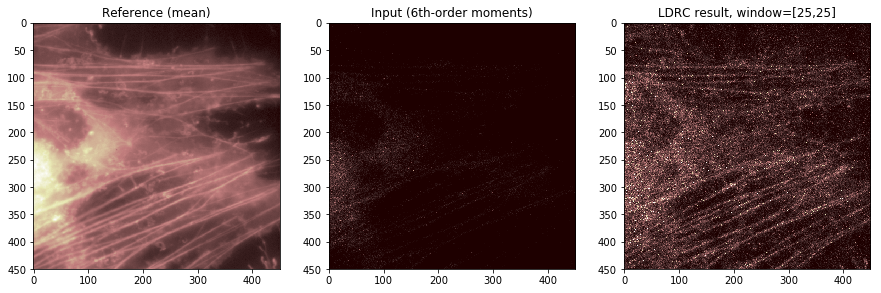

In [7]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].set_title('Reference (mean)')
axs[0].imshow(mean, cmap='pink')

axs[1].set_title('Input (6th-order moments)')
axs[1].imshow(m6, cmap='pink')

axs[2].set_title('LDRC result, window=[25,25]')
axs[2].imshow(ldrc_im, cmap='pink', vmin=0, vmax=2000)
plt.show()

We can also use bokeh to explore the results.

In [8]:
v.bokeh_visualization_mult([mean, m6, ldrc_im], 
                           ['Reference (mean)', 'Input (6th-order moments)', 'LDRC result, window=[25,25]'], 
                           save_option = True,
                           filename='LDRC result')

#### 3.3: window size choices for *ldrc*

Window size is empirical and can be changed based on data. In practice, different window sizes were tried and the final value is selected based on the visual quality of the result. Here we try out different values for the window size to explore how the window size affect the final result.

Let's first try to set the window size to be 5 by 5 pixels and inspect the result.

[====================] 100%

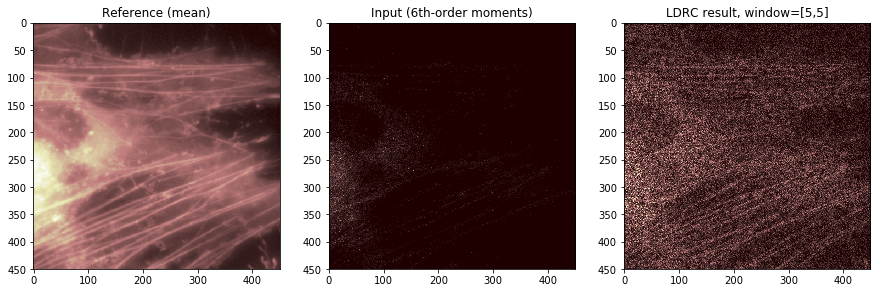

In [9]:
ldrc_im = ldrc.ldrc(mask_im=mean, input_im=m6, order=6, window_size=[5, 5])

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].set_title('Reference (mean)')
axs[0].imshow(mean, cmap='pink')

axs[1].set_title('Input (6th-order moments)')
axs[1].imshow(m6, cmap='pink')

axs[2].set_title('LDRC result, window=[5,5]')
axs[2].imshow(ldrc_im, cmap='pink')
plt.show()

We can see that when the window size is small, the background becomes highlighted in the areas where the feature of interest is sparse. 

Now let's see what happens if the window size is too big, below we set the window size to be 100 by 100 pixels.


[====================] 100%

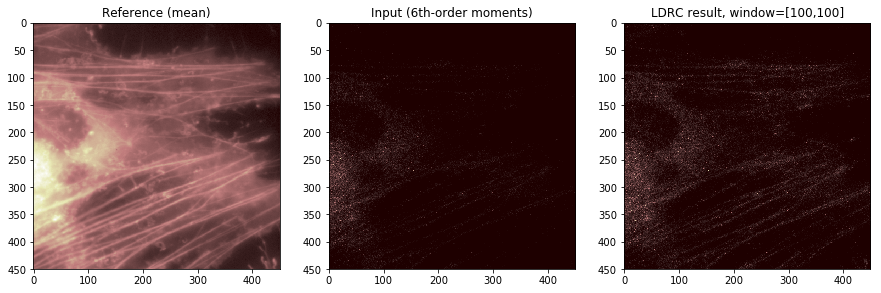

In [10]:
ldrc_im = ldrc.ldrc(mask_im=mean, input_im=m6, order=6, window_size=[100, 100])

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].set_title('Reference (mean)')
axs[0].imshow(mean, cmap='pink')

axs[1].set_title('Input (6th-order moments)')
axs[1].imshow(m6, cmap='pink')

axs[2].set_title('LDRC result, window=[100,100]')
axs[2].imshow(ldrc_im, cmap='pink')
plt.show()

Now let's see the effect of a moderate size of the sliding window for ldrc. Below we choose it to be 55 by 55 pixels.

[====================] 100%

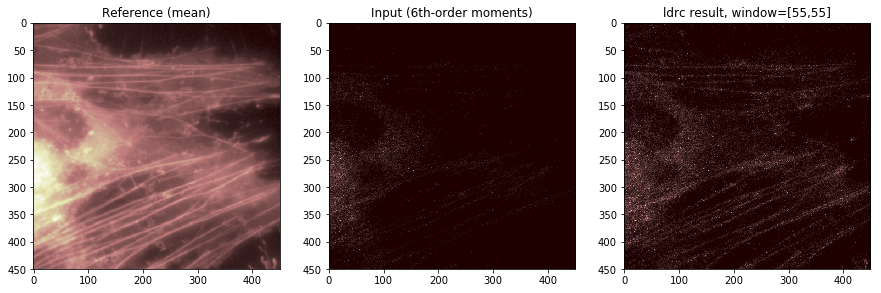

In [11]:
ldrc_im = ldrc.ldrc(mask_im=mean, input_im=m6, order=6, window_size=[55, 55])

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].set_title('Reference (average)')
axs[0].imshow(mean, cmap='pink')

axs[1].set_title('Input (6th-order moments)')
axs[1].imshow(m6, cmap='pink')

axs[2].set_title('ldrc result, window=[55,55]')
axs[2].imshow(ldrc_im, cmap='pink')
plt.show()

From images shown above, we can see that if the window size is too small, the processed image would be very niosy. If the window size is too large, the dynamic range is not compressed enough, thus the processed image is still very dim. Here we find that we get the best result when <code>window_size=[25, 25]</code>.

Feel free to increase the order of moments reconstruction and try out ldrc method yourself. **Note** that in SOFI 2.0 pipeline, if you choose to perform [Fourier interpolation](https://github.com/xiyuyi-at-LLNL/pysofi/blob/master/Notebooks/E5_FourierInterpolation.ipynb) as the first step, you need to change the window size accordingly based on the interpolation factor.



## 4. calculate ldrc from the <code>PysofiData</code> class
Here we demonstrate performing the ldrc analysis on the $6^{th}$ order moment image through the workflow embedded in <code>PysofiData</code> class.

#### 4.1. load data into the <code>PysofiData</code> class, and calculate the $6^{th}$ order moment


In [5]:
# load data into PysofiData object
filepath = '../sampledata'
filename = 'Block1.tif'
# load teh data into a PysofiData class object
d = pysofi.PysofiData(filepath, filename)
# calculate moments
d.moment_image(order=6, finterp=False)

Calculating the 6-order moment ...
[==============================] 100.0%



array([[1.46599590e+14, 9.05711910e+13, 2.72101760e+14, ...,
        5.93501324e+13, 3.24920131e+13, 1.17421899e+13],
       [2.23073244e+14, 2.07648825e+14, 6.17152817e+13, ...,
        9.53009545e+12, 1.82793658e+13, 2.11748601e+13],
       [7.72294305e+13, 1.53038092e+14, 1.89051585e+14, ...,
        1.46539298e+13, 4.51098927e+13, 1.85342185e+13],
       ...,
       [5.73095671e+14, 9.91148087e+14, 9.38150529e+14, ...,
        4.70062319e+13, 3.00623048e+13, 1.77253615e+13],
       [1.85997333e+15, 1.56277289e+15, 1.24843658e+15, ...,
        4.48477458e+13, 3.72612512e+13, 8.43104581e+13],
       [2.36088842e+15, 2.60997572e+15, 1.67336088e+15, ...,
        3.40322498e+13, 4.73198124e+13, 2.66580441e+13]])

In [ ]:
# perfrom ldrc
d.ldrc(mask_im=d.ave, input_im=d.moments_set[6], order=6, window_size=[20, 20])

we can now visualize the results:

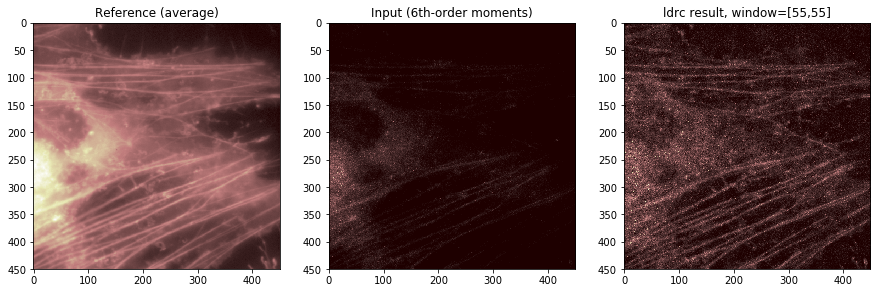

In [12]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
# first, visualize the average image
axs[0].set_title('Reference (average)')
axs[0].imshow(d.ave, cmap='pink')

# second, visualize the 6th order moemnt image
axs[1].set_title('Input (6th-order moments)')
axs[1].imshow(d.moments_set[6], cmap='pink')

# third, visualize the ldrc corrected 6th order moment image
axs[2].set_title('ldrc result, window=[55,55]')
axs[2].imshow(d.ldrc_image, cmap='pink')
plt.show()